In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
#for dirname, _, filenames in os.walk('/kaggle/input'):
#    for filename in filenames:
#        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

#  Roof Segmentation with U-Net (TensorFlow)
This notebook demonstrates a complete deep learning pipeline for semantic segmentation of roofs from aerial imagery.  
It includes data preprocessing, augmentation, model design, dynamic loss functions, and evaluation with metrics like Dice and IoU.


### Contents
1. Data Overview
2. Preprocessing and Dataset Pipeline
3. Augmentation
4. Model Architecture
5. Loss Functions and Metrics
6. Training Strategy
7. Evaluation and Visualization
8. Key Insights and Future Work


# --------- Data Overview ---------

In [2]:
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Conv2D, Concatenate, Input, UpSampling2D, Conv2DTranspose, MaxPooling2D, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.model_selection import train_test_split

# Попытка импортировать tensorflow_addons (для точного вращения)
try:
    import tensorflow_addons as tfa
    TFA_AVAILABLE = True
except Exception:
    print("tensorflow_addons not available — fallback to 90-degree rotations only.")
    TFA_AVAILABLE = False


# Paths
image_dir = "/kaggle/input/arialimages"
mask_dir = "/kaggle/input/ariallabels"

# Constants
IMG_SIZE = 256
BATCH_SIZE = 4
LRATE = 1e-4
EPOCHS = 60
SEED = 42
AUTOTUNE = tf.data.AUTOTUNE

print("Images:", len(os.listdir(image_dir)))
print("Masks:", len(os.listdir(mask_dir)))

print("Sample image file:", os.listdir(image_dir)[:3])
print("Sample mask file:", os.listdir(mask_dir)[:3])

print("TensorFlow version:", tf.__version__)
print("GPU available:", tf.config.list_physical_devices('GPU'))

2025-11-05 14:51:34.915593: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1762354295.213738      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1762354295.292745      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


tensorflow_addons not available — fallback to 90-degree rotations only.
Images: 30
Masks: 25
Sample image file: ['379.png', '314.png', '278.png']
Sample mask file: ['379.png', '314.png', '278.png']
TensorFlow version: 2.18.0
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


In [3]:
# Load images and masks

def load_images_and_masks(image_dir, mask_dir, img_size=IMG_SIZE):
    images, masks = [], []
    image_names = []
    unlabeled_images = []

    mask_dict = {os.path.splitext(f)[0]: f for f in os.listdir(mask_dir)}

    for img_name in os.listdir(image_dir):
        stem = os.path.splitext(img_name)[0]
        img_path = os.path.join(image_dir, img_name)

        # Load image
        img = load_img(img_path, target_size=(img_size, img_size))
        img_arr = img_to_array(img).astype(np.float32) / 255.0
        
        if stem in mask_dict:
            mask_path = os.path.join(mask_dir, mask_dict[stem])
            mask = load_img(mask_path, target_size=(img_size, img_size), color_mode="grayscale")
            mask_arr = img_to_array(mask).astype(np.float32) / 255.0 # binary mask
            mask_arr = (mask_arr > 0.5).astype(np.float32)
    
            # Ensure mask shape matches image
            if img_arr.shape[:2] != mask_arr.shape[:2]:
                print(f"WARNING: Shape mismatch for {img_name} and {mask_dict[stem]} — skipping.")
                continue

            images.append(img_arr)
            masks.append(mask_arr)
            image_names.append(img_name)
        else:
            unlabeled_images.append(img_arr)

    images = np.array(images, dtype=np.float32)
    masks = np.array(masks, dtype=np.float32)
    unlabeled_images = np.array(unlabeled_images, dtype=np.float32)

    # Ensure (H, W, 1) for masks
    if masks.ndim == 3:
        masks = np.expand_dims(masks, axis=-1)

    print(f"Loaded {len(images)} labeled image–mask pairs")
    print(f"Found {len(unlabeled_images)} unlabeled images (for testing)")
    
    return images, masks, image_names, unlabeled_images



x_train, y_train, image_names, x_unlabeled = load_images_and_masks(image_dir, mask_dir)

Loaded 25 labeled image–mask pairs
Found 5 unlabeled images (for testing)


In [4]:
import numpy as np

def summarize_dataset(images, masks, image_names=None):
    n_images = len(images)
    img_shape = images[0].shape if n_images > 0 else None
    mask_shape = masks[0].shape if len(masks) > 0 else None
    
    print(f"Number of images: {n_images}")
    if image_names:
        print(f"Example names: {image_names[:5]}")
    print(f"Image shape: {img_shape}")
    print(f"Mask shape: {mask_shape}")
    
    # Pixel statistics
    print(f"Image pixel range: {images.min():.3f} - {images.max():.3f}")
    print(f"Mask pixel range: {masks.min():.3f} - {masks.max():.3f}")
    
    # Foreground/background ratio
    foreground_ratio = np.mean(masks)
    print(f"Foreground pixel ratio: {foreground_ratio:.3f} ({foreground_ratio*100:.1f}%)")
    
    # Optional: unique mask values
    unique_vals = np.unique(masks)
    print(f"Unique mask values: {unique_vals}")
    
    # Optional: mean image intensity per channel
    if images.ndim == 4 and images.shape[-1] == 3:  # RGB
        channel_means = images.mean(axis=(0,1,2))
        print(f"Mean image intensity per channel: {channel_means}")

# Example usage
summarize_dataset(x_train, y_train, image_names=image_names)


Number of images: 25
Example names: ['379.png', '314.png', '278.png', '303.png', '315.png']
Image shape: (256, 256, 3)
Mask shape: (256, 256, 1)
Image pixel range: 0.000 - 1.000
Mask pixel range: 0.000 - 1.000
Foreground pixel ratio: 0.146 (14.6%)
Unique mask values: [0. 1.]
Mean image intensity per channel: [0.2882322  0.28666773 0.25575116]


#  Challenges 

- Small dataset (24 images): deep models like EfficientNet U-Net may overfit.

- Foreground imbalance ( only 14% of all pixel ): the model may be biased toward predicting background. That means:The network can predict “all background” and still get 86% accuracy

- High similarity between background objects (roofs, roads, other structures)

#  Strategy 

- Data Augmentation

- For this small dataset, simpler models often work better
  
- Loss functions: BCE , Dice , Focal Loss
  
- Batch size: 2–4 might be safer given the small dataset
  
- EarlyStopping: patience=10–20, monitor val_loss
  
- Postprocessing to remove spurious detections
  

# ---------  Preprocessing ---------

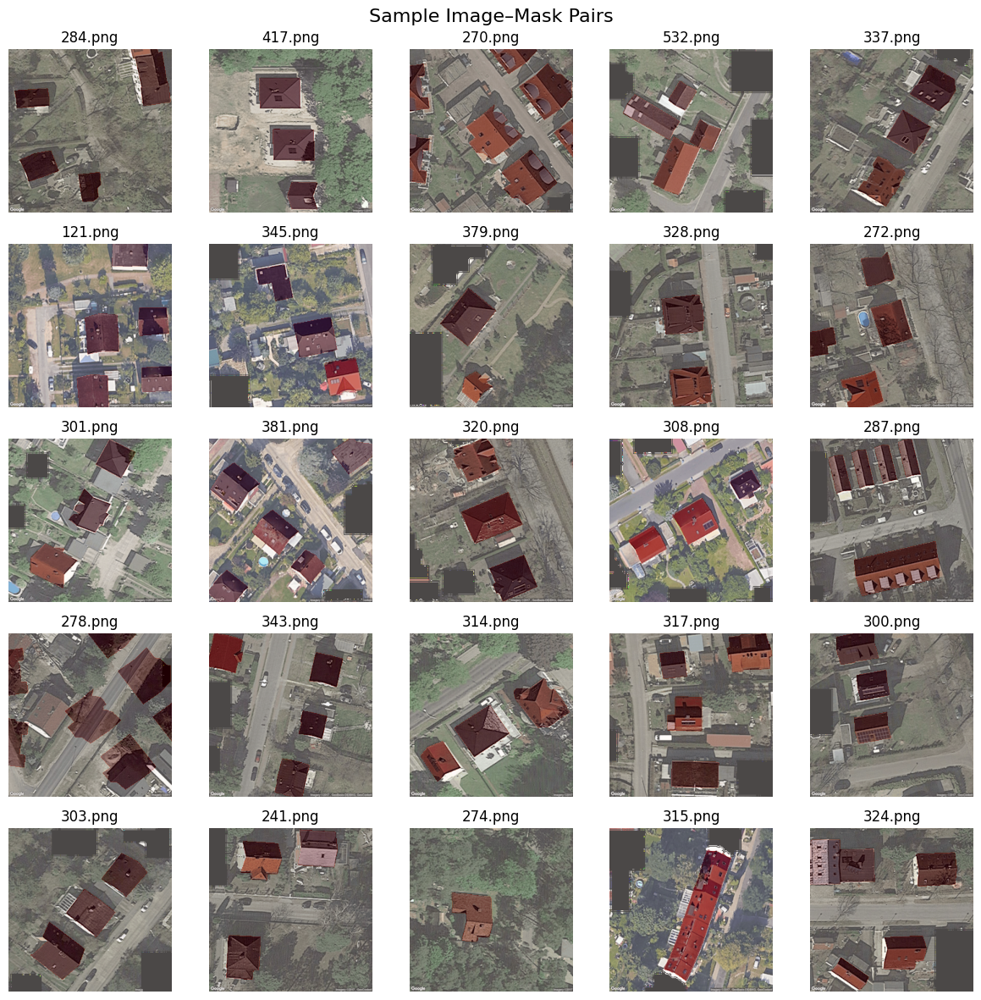

In [5]:
# Visual check of the dataset (since it is small it is not a problem)

#plt.imshow(y_train[5].squeeze(), cmap='gray')
#plt.show()
import matplotlib.pyplot as plt
import random

def visualize_pairs(x, y, names=None, n=25):
    """
    Show n image–mask pairs in a grid (5×5).
    """
    n = min(n, len(x))
    indices = random.sample(range(len(x)), n)
    plt.figure(figsize=(12, 12))
    
    for i, idx in enumerate(indices):
        img = x[idx]
        mask = y[idx].squeeze()
        name = names[idx] if names else f"idx {idx}"
        
        plt.subplot(5, 5, i+1)
        plt.imshow(img)
        plt.imshow(mask, cmap='Reds', alpha=0.3)  # overlay mask in red
        plt.title(name[:20])  # show first part of filename
        plt.axis('off')
    
    plt.suptitle("Sample Image–Mask Pairs", fontsize=16)
    plt.tight_layout()
    plt.show()

# Example use:
visualize_pairs(x_train, y_train, image_names, n=25)


The masks correspond to the images, which is good. However, one mask — '278.png' — is incorrect and does not match the corresponding image.

In [6]:
bad_name = "278.png"
if bad_name in image_names:
    idx = image_names.index(bad_name)
    x_train = np.delete(x_train, idx, axis=0)
    y_train = np.delete(y_train, idx, axis=0)
    image_names.pop(idx)
    print(idx)

2


#  ---------  Creating Dataset

In [7]:
# -----------------------
# Creating tf.data.Dataset
# -----------------------
def create_dataset(images, masks, batch_size=BATCH_SIZE, augment=False, shuffle=True):
    dataset = tf.data.Dataset.from_tensor_slices((images, masks))
    if shuffle:
        dataset = dataset.shuffle(buffer_size=len(images), seed=SEED)
    if augment:
        # map должен работать с тензорами и @tf.function augment_image — всё TF-операции
        dataset = dataset.map(lambda x, y: augment_image(x, y), num_parallel_calls=AUTOTUNE)
    dataset = dataset.batch(batch_size, drop_remainder=False)
    dataset = dataset.prefetch(AUTOTUNE)
    return dataset

In [8]:
# -----------------------
# Augmentation: MUST be the same for both image and mask
# -----------------------

'''

def tf_rotate_both(img, mask, angle):
    if TFA_AVAILABLE:
        # tfa.image.rotate принимает угол в радианах
        img = tfa.image.rotate(img, angle, fill_mode='reflect')  # fill_mode по необходимости
        mask = tfa.image.rotate(mask, angle, fill_mode='nearest')  # для маски лучше nearest
    else:
        # fallback: round the angle to the nearest of {0, 90, 180, 270}
        # angle in radians; convert to quarts
        deg = angle * 180.0 / np.pi
        # вычисляем k = round(deg / 90) mod 4
        k = tf.math.floormod(tf.cast(tf.round(deg / 90.0), tf.int32), 4)
        img = tf.image.rot90(img, k=k)
        mask = tf.image.rot90(mask, k=k)
    return img, mask
'''

"\n\ndef tf_rotate_both(img, mask, angle):\n    if TFA_AVAILABLE:\n        # tfa.image.rotate принимает угол в радианах\n        img = tfa.image.rotate(img, angle, fill_mode='reflect')  # fill_mode по необходимости\n        mask = tfa.image.rotate(mask, angle, fill_mode='nearest')  # для маски лучше nearest\n    else:\n        # fallback: round the angle to the nearest of {0, 90, 180, 270}\n        # angle in radians; convert to quarts\n        deg = angle * 180.0 / np.pi\n        # вычисляем k = round(deg / 90) mod 4\n        k = tf.math.floormod(tf.cast(tf.round(deg / 90.0), tf.int32), 4)\n        img = tf.image.rot90(img, k=k)\n        mask = tf.image.rot90(mask, k=k)\n    return img, mask\n"

In [9]:
''''''

@tf.function
def augment_image(img, mask):


    # Ensure float32 and normalize if needed
    img = tf.cast(img, tf.float32)
    mask = tf.cast(mask, tf.float32)
    if tf.reduce_max(img) > 1.0:
        img = img / 255.0

    # ---------- Flip ----------
    if tf.random.uniform(()) > 0.5:
        img = tf.image.flip_left_right(img)
        mask = tf.image.flip_left_right(mask)

    # ---------- Rotation ----------
    if tf.random.uniform(()) > 0.2:
        angle = tf.random.uniform((), -np.pi/6, np.pi/6)  # ±30°
        if TFA_AVAILABLE:
            img = tfa.image.rotate(img, angle, fill_mode="reflect")
            mask = tfa.image.rotate(mask, angle, fill_mode="nearest")
        else:
            deg = angle * 180.0 / np.pi
            k = tf.math.floormod(tf.cast(tf.round(deg / 90.0), tf.int32), 4)
            img = tf.image.rot90(img, k=k)
            mask = tf.image.rot90(mask, k=k)

    # ---------- Random Zoom ----------
    if tf.random.uniform(()) > 0.5:
        scale = tf.random.uniform((), 0.9, 1.5)
        new_size = tf.cast(scale * IMG_SIZE, tf.int32)
        img = tf.image.resize(img, [new_size, new_size], method="bilinear")
        mask = tf.image.resize(mask, [new_size, new_size], method="nearest")
        img = tf.image.resize_with_crop_or_pad(img, IMG_SIZE, IMG_SIZE)
        mask = tf.image.resize_with_crop_or_pad(mask, IMG_SIZE, IMG_SIZE)

    # ---------- Brightness / Contrast / Gamma ----------
    #img = tf.image.random_brightness(img, 0.15)
    #img = tf.image.random_contrast(img, 0.9, 1.1)

    # Random gamma (simulate shadow / lighting change)
    #if tf.random.uniform(()) > 0.5:
    #    gamma = tf.random.uniform((), 0.9, 1.1)
    #    img = tf.pow(img, gamma)

    # ---------- Padding jitter (small translation) ----------
    #if tf.random.uniform(()) > 0.5:
    #    max_shift = 10
    #    offset_x = tf.random.uniform((), -max_shift, max_shift, dtype=tf.int32)
    #    offset_y = tf.random.uniform((), -max_shift, max_shift, dtype=tf.int32)
    #    img = tf.image.pad_to_bounding_box(img, max_shift, max_shift, IMG_SIZE + 2*max_shift, IMG_SIZE + 2*max_shift)
    #    mask = tf.image.pad_to_bounding_box(mask, max_shift, max_shift, IMG_SIZE + 2*max_shift, IMG_SIZE + 2*max_shift)
    #    img = tf.image.crop_to_bounding_box(img, max_shift + offset_y, max_shift + offset_x, IMG_SIZE, IMG_SIZE)
    #    mask = tf.image.crop_to_bounding_box(mask, max_shift + offset_y, max_shift + offset_x, IMG_SIZE, IMG_SIZE)

    # ---------- Safety & cleanup ----------
    img = tf.where(tf.math.is_finite(img), img, tf.zeros_like(img))
    mask = tf.where(tf.math.is_finite(mask), mask, tf.zeros_like(mask))

    img = tf.clip_by_value(img, 0.0, 1.0)
    mask = tf.clip_by_value(mask, 0.0, 1.0)
    mask = tf.round(mask)

    # ---------- Ensure shapes ----------
    img.set_shape([IMG_SIZE, IMG_SIZE, 3])
    mask.set_shape([IMG_SIZE, IMG_SIZE, 1])

    return img, mask


In [10]:
# -----------------------
# Train / val split and dataset creation
# -----------------------
x_tr, x_val, y_tr, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state=SEED)

train_ds = create_dataset(x_tr, y_tr, augment=True, shuffle=True)
val_ds = create_dataset(x_val, y_val, augment=False, shuffle=False)

I0000 00:00:1762354312.972473      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1762354312.973182      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


In [11]:
# -----------------------
# Augmentation visualization
# -----------------------
def visualize_augmentations(dataset,names=None, n=5):
    # Collect batches until we have at least n samples
    images, masks = [], []
    count = 0
    for batch in dataset:
        imgs, msks = batch
        imgs = imgs.numpy()
        msks = msks.numpy()
        for i in range(imgs.shape[0]):
            images.append(imgs[i])
            masks.append(msks[i].squeeze())
            count += 1
            if count >= n:
                break
        if count >= n:
            break

    images = np.array(images)
    masks = np.array(masks)

    # If names are provided, truncate or pad
    names_to_use = names[:n] if names is not None else None

    # Reuse visualize_pairs function
    visualize_pairs(images, masks, names=names_to_use, n=n)

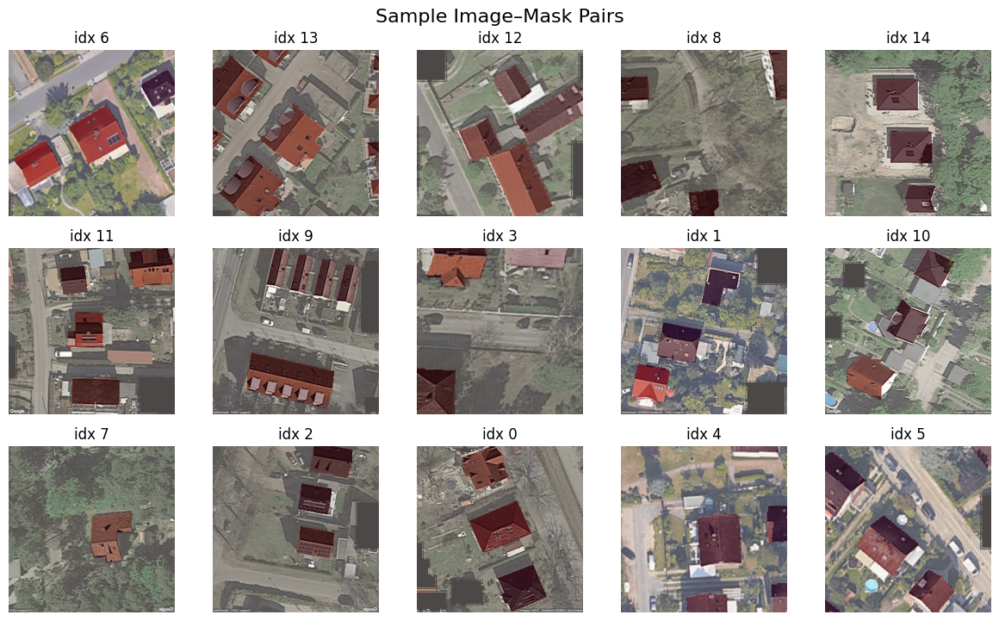

In [12]:
# Augmentation visualization
visualize_augmentations(train_ds, n=15)

# ---------  Model Architecture

In [13]:
# -----------------------
# Constants
# -----------------------
#IMG_SIZE = 256
#BATCH_SIZE = 8
#LRATE = 5e-4
#SEED = 42
#AUTOTUNE = tf.data.AUTOTUNE


In [14]:

# -----------------------------------------------------------
# Small, Regularized U-Net — tuned for small roof dataset
# -----------------------------------------------------------
def conv_block(x, filters, dropout_rate=0.0):
    x = Conv2D(filters, 3, padding='same', activation='relu')(x)
    #x = BatchNormalization()(x)
    x = Conv2D(filters, 3, padding='same', activation='relu')(x)
    #x = BatchNormalization()(x)
    if dropout_rate > 0:
        x = Dropout(dropout_rate)(x)
    return x


def build_small_unet(input_shape=(256, 256, 3)):
    inputs = Input(shape=input_shape)

    # -------- Encoder --------
    c1 = conv_block(inputs, 32)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = conv_block(p1, 64)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = conv_block(p2, 128, dropout_rate=0.1)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = conv_block(p3, 256, dropout_rate=0.2)
    p4 = MaxPooling2D((2, 2))(c4)

    # -------- Bottleneck --------
    bn = conv_block(p4, 512, dropout_rate=0.3)

    # -------- Decoder --------
    u4 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(bn)
    u4 = Concatenate()([u4, c4])
    c5 = conv_block(u4, 256, dropout_rate=0.2)

    u3 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u3 = Concatenate()([u3, c3])
    c6 = conv_block(u3, 128, dropout_rate=0.1)

    u2 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u2 = Concatenate()([u2, c2])
    c7 = conv_block(u2, 64)

    u1 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u1 = Concatenate()([u1, c1])
    c8 = conv_block(u1, 32)

    # -------- Output --------
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c8)

    model = Model(inputs, outputs, name="Small_UNet")
    return model


# ---------  Loss Functions and Metrics

In [15]:
# Custom metrics

def dice_coef(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def iou_coef(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    union = tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)
    
    
def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def bce_dice_loss(y_true, y_pred, dice_weight=0.5):
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    d_loss = dice_loss(y_true, y_pred)
    return (1 - dice_weight) * bce + dice_weight * d_loss #bce + d_loss

def focal_loss(y_true, y_pred, alpha=0.75, gamma=2.0):
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    bce_exp = tf.exp(-bce)
    focal = alpha * (1 - bce_exp)**gamma * bce
    return tf.reduce_mean(focal)


In [16]:
def sobel_edges_tf(x):
    """Compute edge magnitude using Sobel filters in pure TF."""
    # Sobel kernels
    gx = tf.image.sobel_edges(x)[..., 0]  # horizontal
    gy = tf.image.sobel_edges(x)[..., 1]  # vertical
    return tf.sqrt(tf.square(gx) + tf.square(gy) + 1e-6)

def boundary_loss(y_true, y_pred):
    """Penalize difference between edge maps."""
    true_edges = sobel_edges_tf(y_true)
    pred_edges = sobel_edges_tf(y_pred)
    return tf.reduce_mean(tf.abs(true_edges - pred_edges))

def total_loss(y_true, y_pred):
    """Combined BCE + Dice + boundary-aware loss."""
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    d_loss = dice_loss(y_true, y_pred)
    b_loss = boundary_loss(y_true, y_pred)
    return bce + d_loss + 0.8 * b_loss


In [17]:
def dynamic_total_loss(boundary_weight_max=0.8, ramp_up_epochs=30):
    """
    Returns a closure that computes BCE + Dice + dynamic boundary loss.
    Boundary weight ramps from 0 → boundary_weight_max across ramp_up_epochs.
    """
    def loss_fn(y_true, y_pred):
        # Base losses
        bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
        d_loss = 1 - (2. * tf.reduce_sum(y_true * y_pred) + 1e-6) / \
                 (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + 1e-6)
        # Boundary loss
        gx = tf.image.sobel_edges(y_pred)[..., 0]
        gy = tf.image.sobel_edges(y_pred)[..., 1]
        pred_edges = tf.sqrt(tf.square(gx) + tf.square(gy) + 1e-6)
        gx_t = tf.image.sobel_edges(y_true)[..., 0]
        gy_t = tf.image.sobel_edges(y_true)[..., 1]
        true_edges = tf.sqrt(tf.square(gx_t) + tf.square(gy_t) + 1e-6)
        b_loss = tf.reduce_mean(tf.abs(true_edges - pred_edges))

        # Get current epoch (via tf.keras.backend.get_value on a variable)
        epoch_var = tf.keras.backend.get_value(loss_fn.current_epoch)
        boundary_weight = min(boundary_weight_max, epoch_var / ramp_up_epochs * boundary_weight_max)
        return bce + d_loss + boundary_weight * b_loss

    # we’ll update this value manually each epoch
    loss_fn.current_epoch = tf.Variable(0.0, trainable=False, dtype=tf.float32)
    return loss_fn

class EpochLossUpdater(tf.keras.callbacks.Callback):
    def __init__(self, loss_fn):
        super().__init__()
        self.loss_fn = loss_fn

    def on_epoch_begin(self, epoch, logs=None):
        tf.keras.backend.set_value(self.loss_fn.current_epoch, float(epoch))

# ---------  Training Strategy

In [18]:
# -----------------------
# Callbacks
# -----------------------
callbacks = [
    EarlyStopping(monitor='val_loss', patience=25, restore_best_weights=True),
    ModelCheckpoint("best_segmentation_model.h5", monitor='val_loss', save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, min_lr=1e-7, verbose=1)
]

In [19]:
model = build_small_unet()



# Instantiate the dynamic loss
dyn_loss = dynamic_total_loss(boundary_weight_max=0.8, ramp_up_epochs=30)
epoch_updater = EpochLossUpdater(dyn_loss)

# Phase 1 — Dynamic loss training
model.compile(
    optimizer=tf.keras.optimizers.Adam(2e-4),
    loss=dyn_loss, #total_loss,  #
    metrics=["accuracy", dice_coef, iou_coef]
)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=130,
    callbacks=[epoch_updater, *callbacks]
)

# Phase 2 — Fine-tuning
model.compile(
    optimizer=tf.keras.optimizers.Adam(2e-5),  # smaller LR
    loss=dyn_loss,#total_loss,  # simpler loss, less noise
    metrics=["accuracy", dice_coef, iou_coef]
)

finetune_callbacks = [
    ModelCheckpoint("best_finetuned_model.h5", monitor='val_loss', save_best_only=True),
    EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
]

history_finetune = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=60,  # shorter phase
    callbacks=finetune_callbacks
)


'''
'''

Epoch 1/130


I0000 00:00:1762354329.243221      63 service.cc:148] XLA service 0x78befc026200 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1762354329.244285      63 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1762354329.244309      63 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1762354330.336471      63 cuda_dnn.cc:529] Loaded cuDNN version 90300
E0000 00:00:1762354337.563450      63 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1762354337.773986      63 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


1/5 ━━━━━━━━━━━━━━━━━━━━ 1:57 29s/step - accuracy: 0.2965 - dice_coef: 0.2857 - iou_coef: 0.1667 - loss: 1.4086

I0000 00:00:1762354348.772245      63 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.5255 - dice_coef: 0.2631 - iou_coef: 0.1518 - loss: 1.4289 

E0000 00:00:1762354355.440417      63 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1762354355.650978      63 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.5612 - dice_coef: 0.2584 - iou_coef: 0.1487 - loss: 1.4326  
Epoch 1: val_loss improved from inf to 1.46913, saving model to best_segmentation_model.h5
5/5 ━━━━━━━━━━━━━━━━━━━━ 55s 6s/step - accuracy: 0.5850 - dice_coef: 0.2552 - iou_coef: 0.1466 - loss: 1.4350 - val_accuracy: 0.8674 - val_dice_coef: 0.2091 - val_iou_coef: 0.1167 - val_loss: 1.4691 - learning_rate: 2.0000e-04
Epoch 2/130
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.8409 - dice_coef: 0.2375 - iou_coef: 0.1348 - loss: 1.4351
Epoch 2: val_loss improved from 1.46913 to 1.43904, saving model to best_segmentation_model.h5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 220ms/step - accuracy: 0.8410 - dice_coef: 0.2373 - iou_coef: 0.1346 - loss: 1.4342 - val_accuracy: 0.8676 - val_dice_coef: 0.2051 - val_iou_coef: 0.1143 - val_loss: 1.4390 - learning_rate: 2.0000e-04
Epoch 3/130
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.8502 - dice_coef: 0.2170 - iou_coef: 0.1218 - loss: 1.4022
E

'\n'

In [20]:
model.summary()

Model: "Small_UNet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      9,248 │ conv2d[0][0]      │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │     36,928 │ conv2d_2[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │     73,856 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │    147,584 │ conv2d_4[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 64, 64,    │          0 │ conv2d_5[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 32, 32,    │          0 │ dropout[0][0]     │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 32, 32,    │    295,168 │ max_pooling2d_2[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 32, 32,    │    590,080 │ conv2d_6[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 32, 32,    │          0 │ conv2d_7[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 16, 16,    │          0 │ dropout_1[0][0]   │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 16, 16,    │  1,180,160 │ max_pooling2d_3[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 16, 16,    │  2,359,808 │ conv2d_8[0][0]  

 Total params: 23,280,293 (88.81 MB)

 Trainable params: 7,760,097 (29.60 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,520,196 (59.20 MB)

In [21]:
# Save the full model (architecture + weights)
model.save("final_segmentation_model.h5")

# Later one can load it with:
# from tensorflow.keras.models import load_model
# model = load_model("final_apple_segmentation_model.h5", custom_objects={'dice_coef': dice_coef, 'iou_coef': iou_coef})

In [22]:
val_loss, val_acc, val_dice, val_iou = model.evaluate(val_ds, verbose=1)
print(f"Validation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Validation Dice: {val_dice:.4f}")
print(f"Validation IoU:  {val_iou:.4f}")

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.9577 - dice_coef: 0.8331 - iou_coef: 0.7146 - loss: 0.4264
Validation Loss: 0.4200
Validation Accuracy: 0.9584
Validation Dice: 0.8410
Validation IoU:  0.7263


**1) Validation Loss:**

Loss depends on the loss function. For BCE+Dice+boundary, values around 0.4–0.6 are typical for moderately small datasets.

Lower is better, but the absolute number is less important than trends (steady decrease, no divergence). 
Not overfitting too much.

**2) Validation Accuracy:** 

Accuracy in segmentation is dominated by background pixels if the target is sparse (e.g., roofs on streets).

High accuracy can be misleading — even a model predicting mostly background can have ~90% accuracy if the foreground is only 10% of pixels.

In our case foreground ratio is ~14%, so Dice and IoU are better indicators.

**3) Dice Coefficient:** 

Dice coefficient (F1 for pixels) is one of the most reliable metrics for segmentation.

Ranges:

0.8–0.9 → very good

0.9 → excellent

<0.7 → room for improvement

 

**4) IoU:** 

IoU (Intersection over Union) is stricter than Dice.

Ranges:

0.7 → good

0.6–0.7 → acceptable

<0.6 → needs tuning



# ---------  Evaluation and Visualization

In [23]:
# Predict masks for unlabeled images
preds = model.predict(x_unlabeled)

# Convert to binary masks (0 or 1)
binary_preds = (preds > 0.5).astype(np.uint8)

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


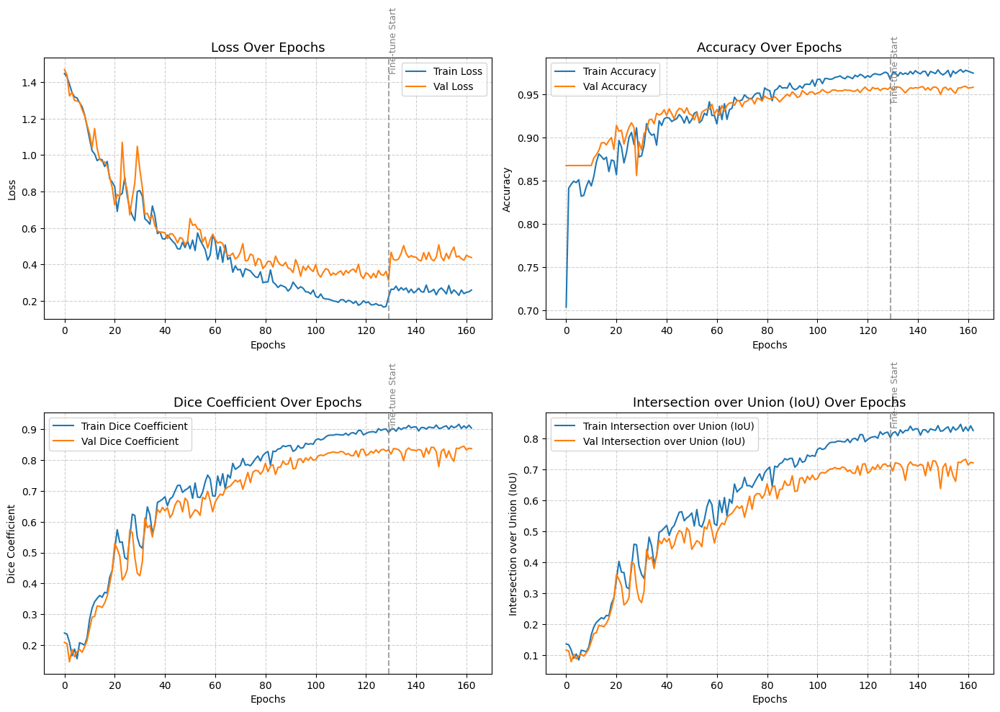

In [24]:
import matplotlib.pyplot as plt

def plot_training_history(history1, history2=None):
    """
    Plot training & validation curves for one or two training stages.
    Works with metrics: loss, accuracy, dice_coef, iou_coef.
    """
    metrics = ['loss', 'accuracy', 'dice_coef', 'iou_coef']
    titles = {
        'loss': 'Loss',
        'accuracy': 'Accuracy',
        'dice_coef': 'Dice Coefficient',
        'iou_coef': 'Intersection over Union (IoU)'
    }

    # Merge histories if there are two
    if history2 is not None:
        merged_history = {}
        for metric in history1.history.keys():
            merged_history[metric] = (
                history1.history[metric] + history2.history.get(metric, [])
            )
        history = merged_history
    else:
        history = history1.history

    # Plot all metrics
    plt.figure(figsize=(14, 10))
    for i, metric in enumerate(metrics):
        plt.subplot(2, 2, i + 1)
        plt.plot(history[metric], label=f"Train {titles[metric]}")
        plt.plot(history[f"val_{metric}"], label=f"Val {titles[metric]}")
        plt.title(f"{titles[metric]} Over Epochs", fontsize=13)
        plt.xlabel("Epochs")
        plt.ylabel(titles[metric])
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.6)

        # If second stage was provided — visually separate it
        if history2 is not None:
            stage1_len = len(history1.history[metric])
            plt.axvline(x=stage1_len - 1, color='gray', linestyle='--', alpha=0.7)
            plt.text(stage1_len - 1, plt.ylim()[1]*0.95, 'Fine-tune Start',
                     rotation=90, color='gray', fontsize=9)

    plt.tight_layout()
    plt.show()


plot_training_history(history,history_finetune)

1)  Training vs Validation Loss

Loss decreasing for both → model is learning.


2)  Accuracy / Dice / IoU

Metrics rising for both training and validation → good learning.

3)  Gaps between train and val

Small gaps are normal.



In [25]:
import cv2
import math
'''
def postprocess_mask(pred, threshold=0.5):
    """
    Convert model output (float mask) into a clean binary mask.
    - Threshold at 0.5
    - Morphological closing (remove small holes)
    """
    pred_bin = (pred > threshold).astype(np.uint8)
    kernel = np.ones((3, 3), np.uint8)
    pred_bin = cv2.morphologyEx(pred_bin, cv2.MORPH_CLOSE, kernel)
    return pred_bin
'''

def postprocess_mask(mask, threshold=0.5, min_area=150, aspect_tolerance=(0.5, 2.5)):
    mask = (mask > 0.5).astype(np.uint8)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    filtered = np.zeros_like(mask)

    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        area = cv2.contourArea(cnt)
        aspect = w / float(h)
        # Keep only "roof-like" blobs (not long roads)
        if min_area < area < mask.shape[0]*mask.shape[1]*0.5 and aspect_tolerance[0] < aspect < aspect_tolerance[1]:
            cv2.drawContours(filtered, [cnt], -1, 1, -1)
    return filtered



1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step


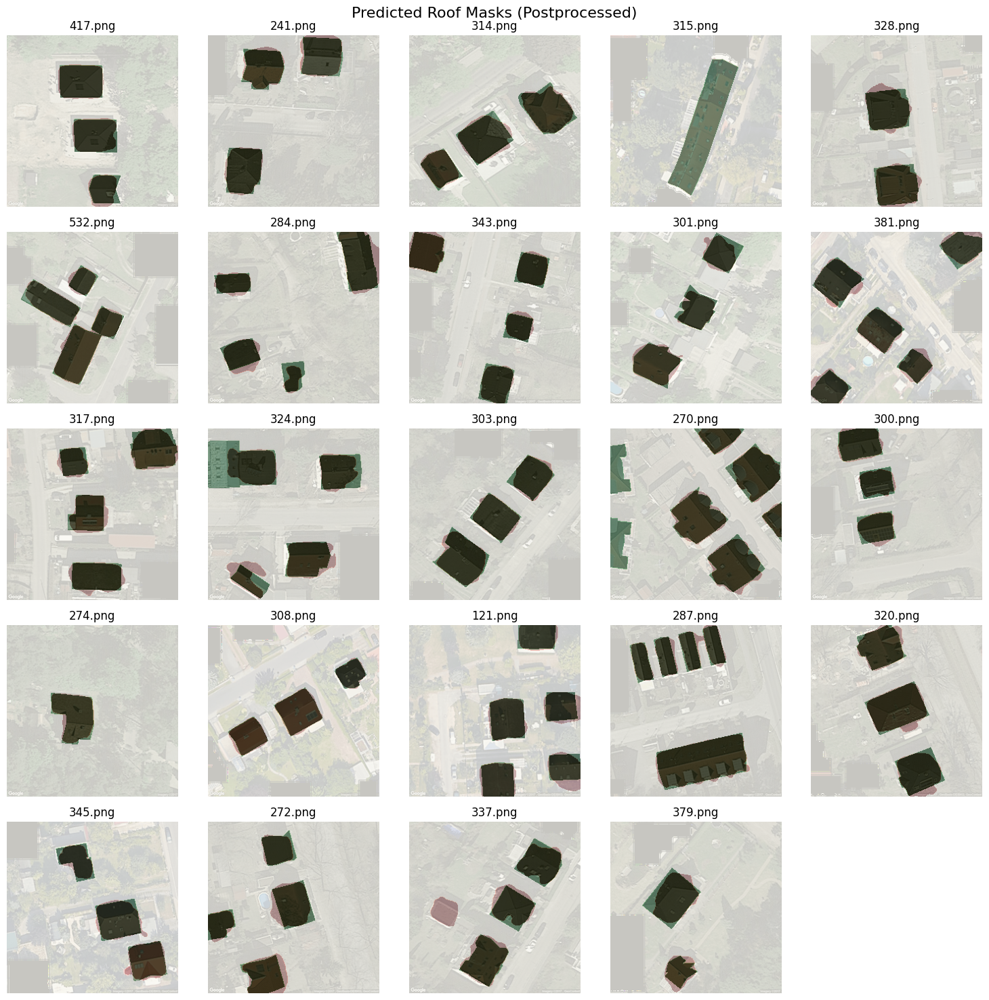

In [26]:
def visualize_predictions(model, x_input, names=None, y_true=None, n=9, threshold=0.5):
    """
    Visualize model predictions with postprocessing.
    Optionally show ground truth masks for comparison.
    """
    preds = model.predict(x_input)
    n = min(n, len(x_input))
    indices = random.sample(range(len(x_input)), n)

    cols = int(math.ceil(math.sqrt(n)))
    rows = int(math.ceil(n / cols))
    
    #plt.figure(figsize=(4 * cols, 4 * rows))
    plt.figure(figsize=(15,15))
    
    for i, idx in enumerate(indices):
        img = x_input[idx]
        raw_pred = preds[idx].squeeze()
        post_pred = postprocess_mask(raw_pred, threshold=threshold)

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.imshow(post_pred, cmap='Reds', alpha=0.6)

        if y_true is not None:
            true_mask = y_true[idx].squeeze()
            plt.imshow(true_mask, cmap='Greens', alpha=0.5)

        if names:
            plt.title(names[idx][:25])
        plt.axis('off')

    plt.suptitle("Predicted Roof Masks (Postprocessed)", fontsize=16)
    plt.tight_layout()
    plt.show()

visualize_predictions(model, x_train, names=image_names, y_true=y_train, n=25)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


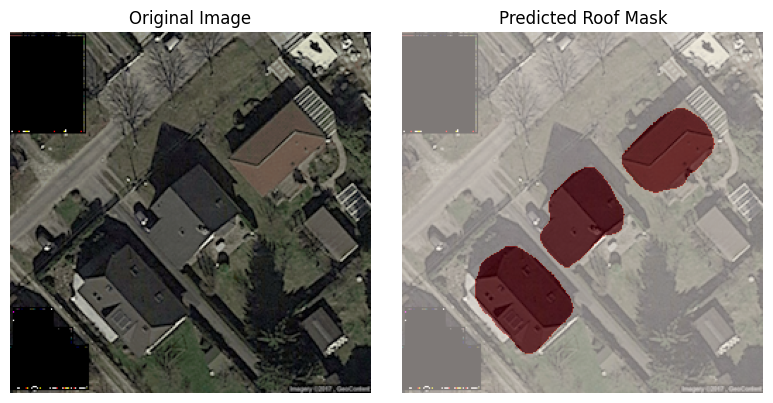

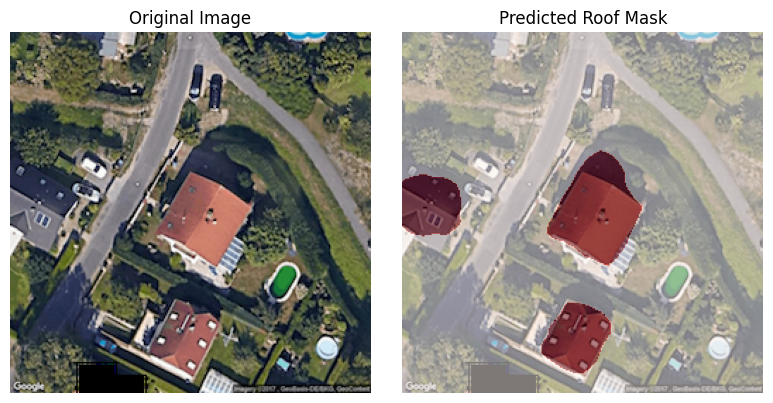

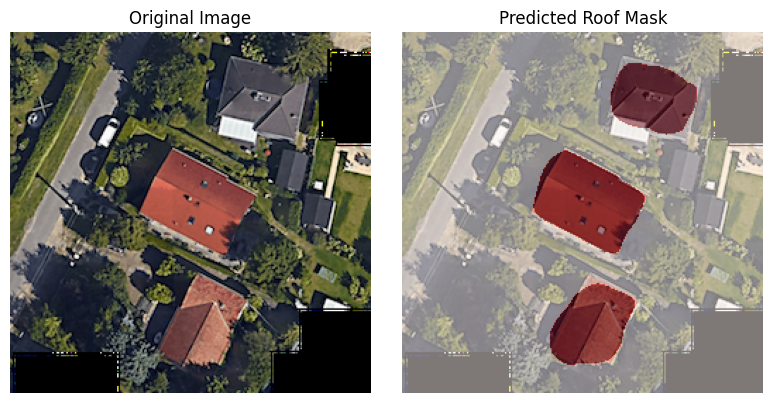

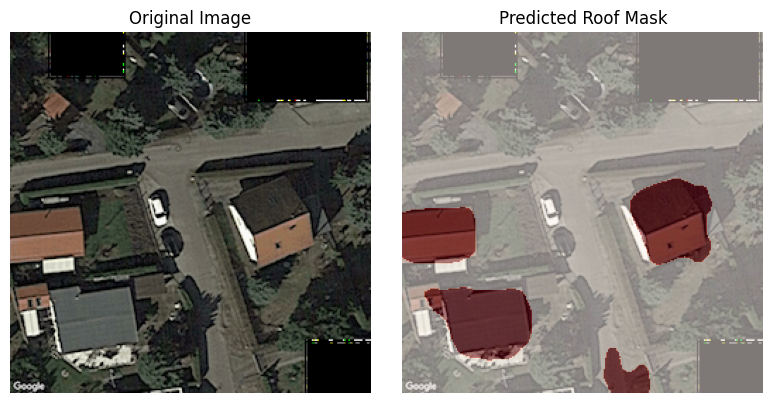

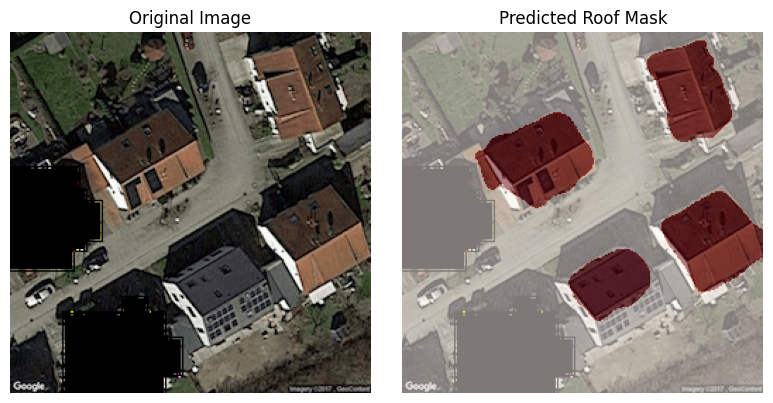

In [27]:
import matplotlib.pyplot as plt
import numpy as np

# Get model predictions on unlabeled data
raw_preds = model.predict(x_unlabeled)
binary_preds = np.array([postprocess_mask(p.squeeze(), threshold=0.5) for p in raw_preds])

# Visualize a few examples
for i in range(min(5, len(x_unlabeled))):
    img = x_unlabeled[i]
    mask = binary_preds[i]

    plt.figure(figsize=(8, 4))

    # Left: original image
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title("Original Image")
    plt.axis('off')

    # Right: predicted mask overlay
    plt.subplot(1, 2, 2)
    plt.imshow(img)
    plt.imshow(mask, cmap='Reds', alpha=0.5)
    plt.title("Predicted Roof Mask")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


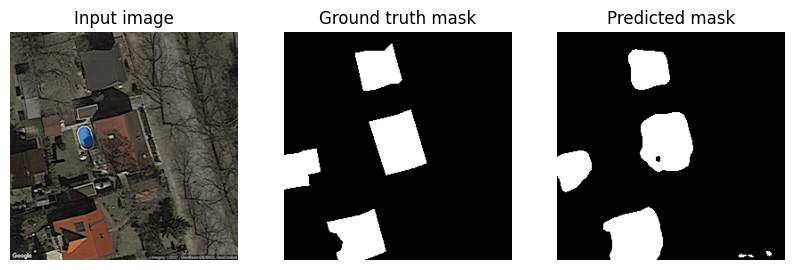

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


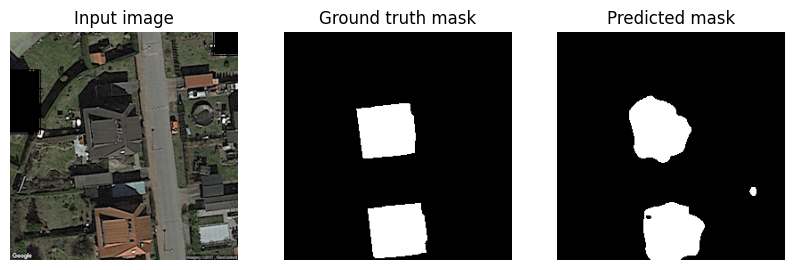

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


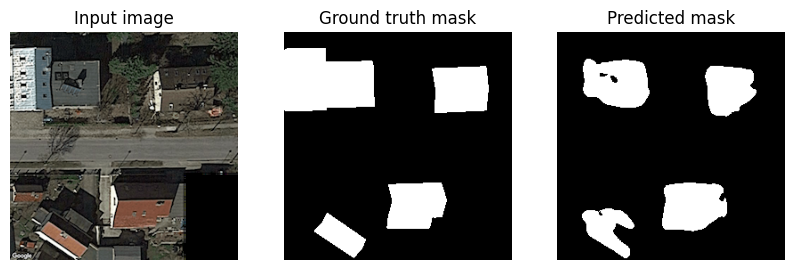

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


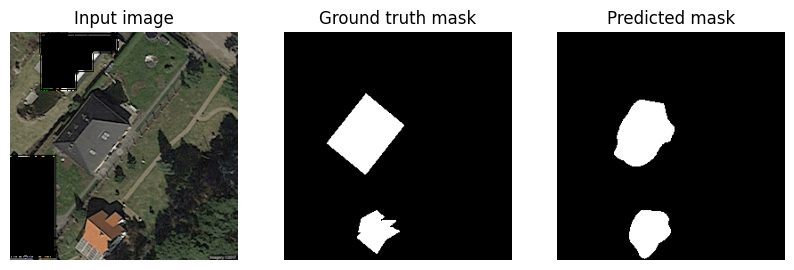

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


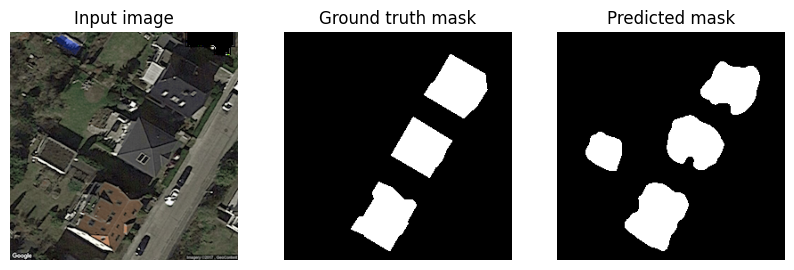

In [28]:
import numpy as np
import matplotlib.pyplot as plt

def show_predictions(model, images, masks, num=5):
    # choose unique random indices (no repeats)
    idxs = np.random.choice(len(images), num, replace=False)
    
    for i in idxs:
        img = images[i]
        true_mask = masks[i].squeeze()
        pred_mask = model.predict(np.expand_dims(img, axis=0))[0].squeeze()
        pred_mask = (pred_mask > 0.5).astype(np.float32)

        plt.figure(figsize=(10,3))
        plt.subplot(1,3,1)
        plt.imshow(img)
        plt.title("Input image")
        plt.axis('off')

        plt.subplot(1,3,2)
        plt.imshow(true_mask, cmap='gray')
        plt.title("Ground truth mask")
        plt.axis('off')

        plt.subplot(1,3,3)
        plt.imshow(pred_mask, cmap='gray')
        plt.title("Predicted mask")
        plt.axis('off')

        plt.show()

# Example usage:
show_predictions(model, x_val, y_val, num=5)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


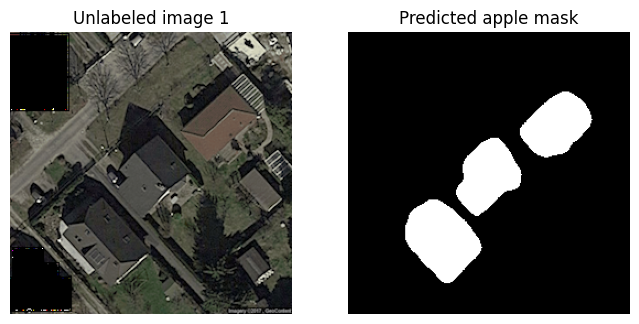

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


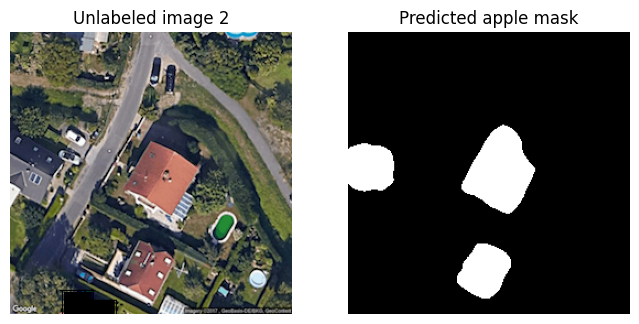

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


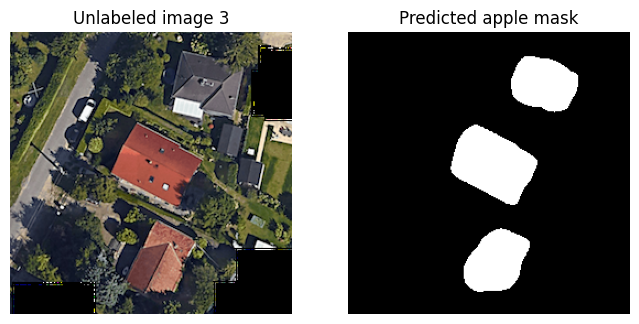

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


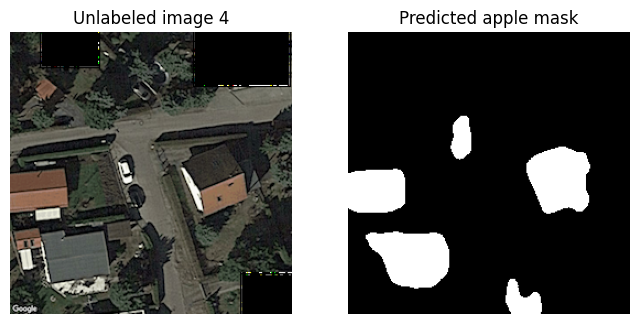

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


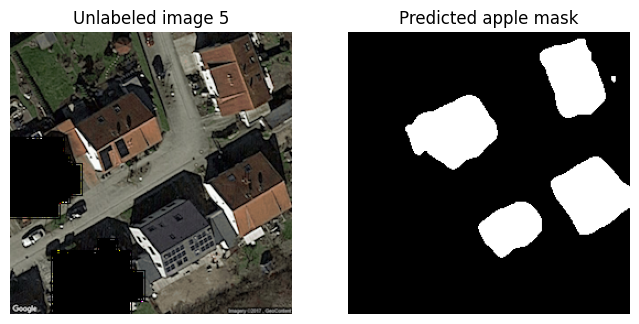

In [29]:
# Predict unlabeled images
 
for i, img in enumerate(x_unlabeled):
    pred_mask = model.predict(np.expand_dims(img, axis=0))[0].squeeze()
    pred_mask = (pred_mask > 0.5).astype(np.float32)

    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title(f"Unlabeled image {i+1}")
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.imshow(pred_mask, cmap='gray')
    plt.title("Predicted apple mask")
    plt.axis('off')
    plt.show()

#  ---------  Conclusions 

Depending on the use case, different types of segmentation errors have different impacts.
For example, in some applications (like roof inventorying for urban planning), it’s preferable to slightly over-segment — marking a region as roof even if uncertain — rather than missing a valid roof.
However, in other contexts (like damage assessment or infrastructure monitoring), false positives are more costly, so a conservative segmentation is preferable.


The current model shows a balanced Dice score (~0.84) but tends toward higher recall, meaning it’s slightly more likely to detect roofs where none exist — a reasonable bias for applications prioritizing completeness over strict precision.

By changing the mask binarization threshold from 0.5 to 0.6, we can make the model more conservative, reducing false roofs.
